## Проект по оценки стоимости домов в Калифорнии
### Переработка и перевод проекта из [книги](https://www.ozon.ru/product/prikladnoe-mashinnoe-obuchenie-s-pomoshchyu-scikit-learn-i-tensorflow-kontseptsii-instrumenty-144106127/?sh=2BNibf6rEA) 

[GitHub оригинала](https://github.com/ageron/handson-ml2/blob/master/02_end_to_end_machine_learning_project.ipynb)


In [1]:
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
housing = pd.read_csv('housing.csv.zip')
housing.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [3]:
housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


In [4]:
housing["ocean_proximity"].value_counts()

ocean_proximity
<1H OCEAN     9136
INLAND        6551
NEAR OCEAN    2658
NEAR BAY      2290
ISLAND           5
Name: count, dtype: int64

In [5]:
housing.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


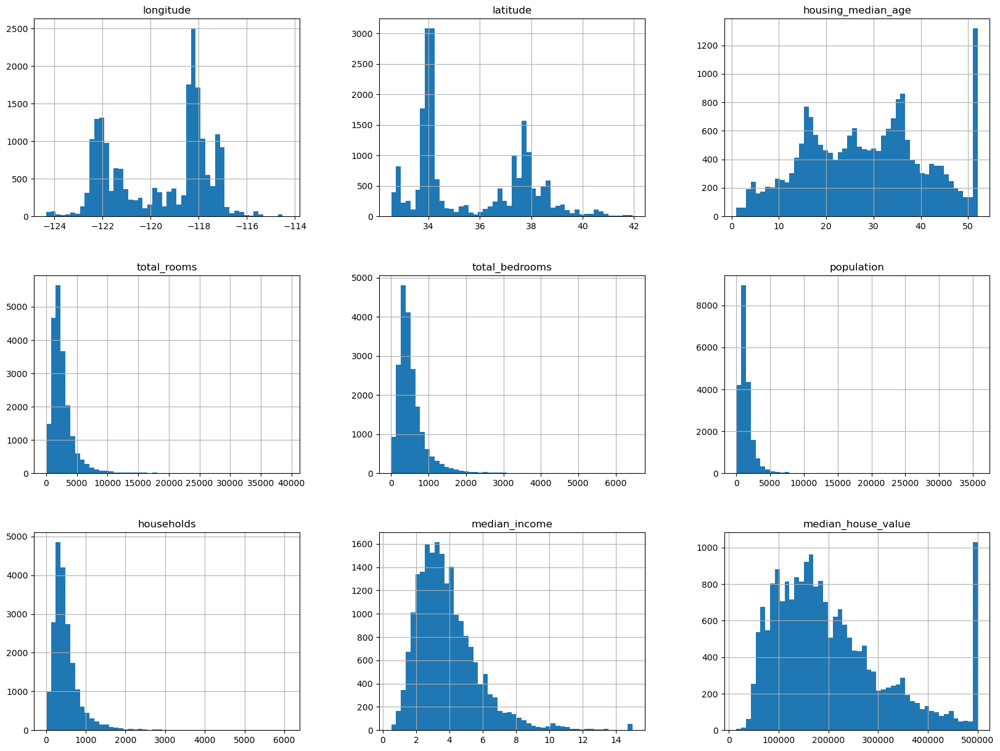

In [6]:
housing.hist(bins=50, figsize=(20,15))
plt.show()

Обратите внимание:
1. Медианный доход (median_income) не выглядит выраженным в долларах США. Фактические данные были масштабированы и ограничены 15 (фактически 15.0001) для высших медианных доходов и 0.5 (фактически 0.4999) для низших медианных доходов.
2. Cредний возраст домов (housing_median_age) также ограничен возрастом до 50 и более лет.
3. Средняя стоимость домов (median_house_value) таже ограгничена стоимостью до и более 500 000$.
4. Разные масштабы данных (могут быть проблемой в дальнейшем).
5. Значительные хвосты в данных (тяжелые хвосты).

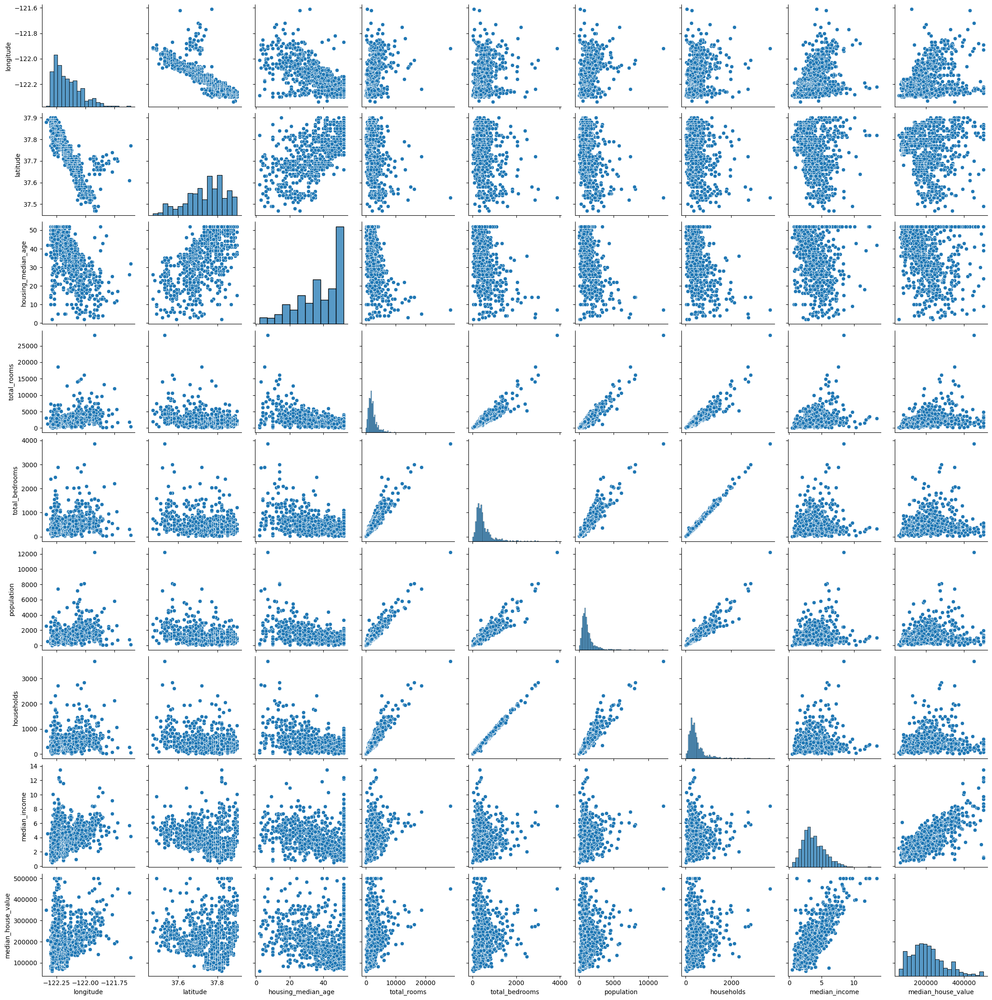

In [7]:
g = sns.pairplot(housing[:1000])

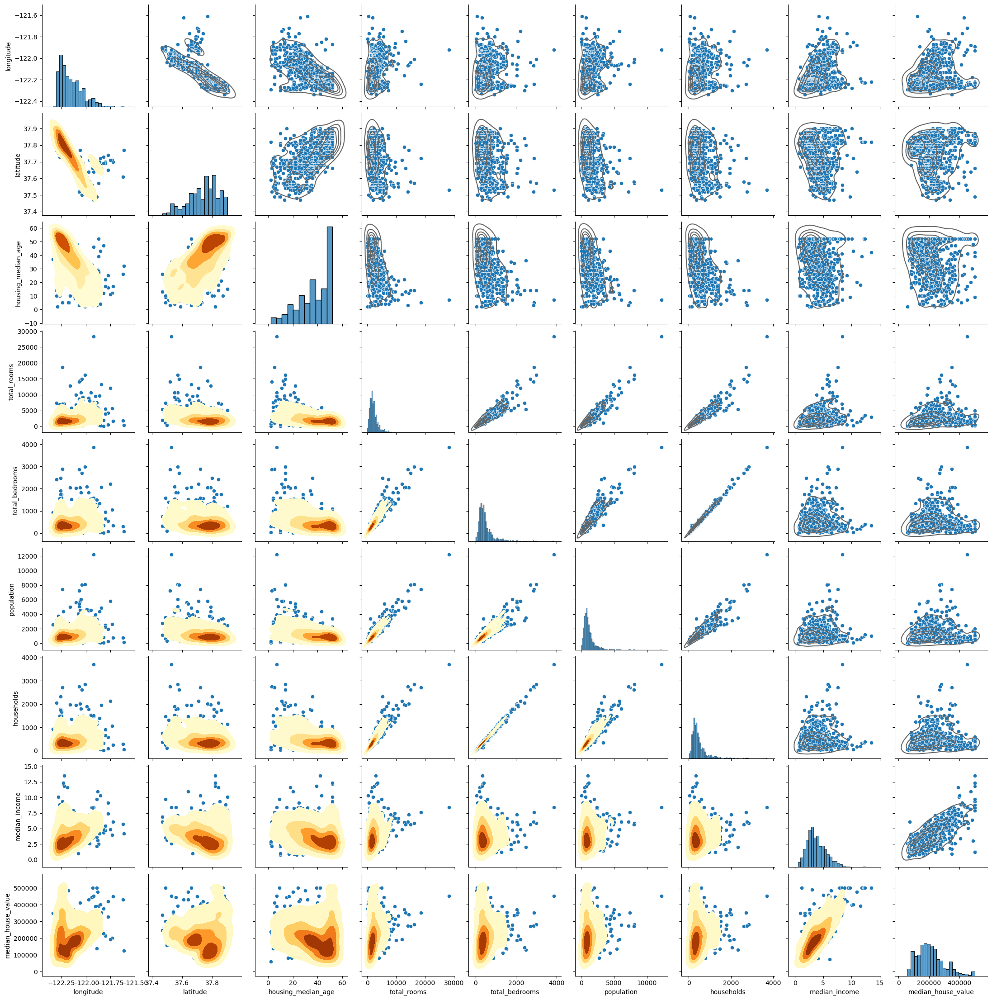

In [8]:
gm = sns.pairplot(housing[:1000])
gm.map_lower(sns.kdeplot, levels=5, color=".4", fill=True, cmap = 'YlOrBr');
gm.map_upper(sns.kdeplot, levels=5, color=".4");

## Преобразование доходов

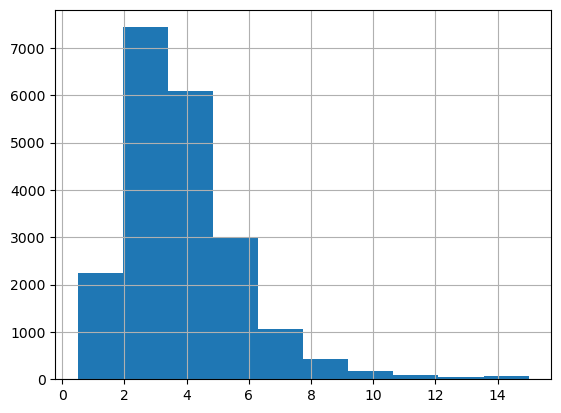

In [9]:
housing["median_income"].hist();

Выполним биннинг данных (в следующем семестре поговорим как это делать автоматически) для более удобного преобразования данных и разделения по категориям

In [10]:
housing["income_cat"] = pd.cut(housing["median_income"],
                               bins=[0., 1.5, 3.0, 4.5, 6., np.inf],
                               labels=[1, 2, 3, 4, 5])
housing.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,income_cat
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY,5
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY,5
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY,5
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY,4
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY,3


Посмотрим как наши данные разделились по категориям

In [11]:
housing["income_cat"].value_counts() 

income_cat
3    7236
2    6581
4    3639
5    2362
1     822
Name: count, dtype: int64

In [12]:
housing["income_cat"].value_counts()/ len(housing)

income_cat
3    0.350581
2    0.318847
4    0.176308
5    0.114438
1    0.039826
Name: count, dtype: float64

In [13]:
cat_plot = (housing["income_cat"].value_counts() / len(housing)).to_frame()
cat_plot

,count
income_cat,
3,0.350581
2,0.318847
4,0.176308
5,0.114438
1,0.039826


<Axes: >

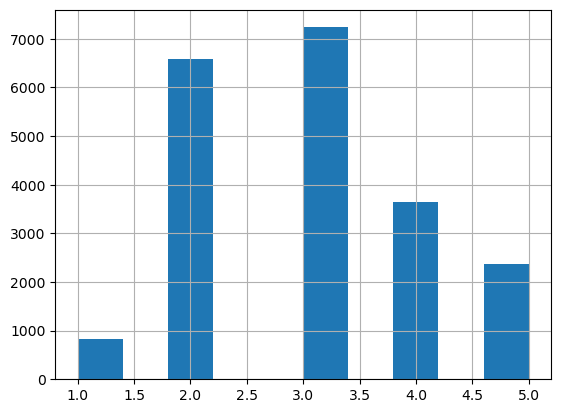

In [14]:
housing["income_cat"].hist()     # крайне не удобный вариант

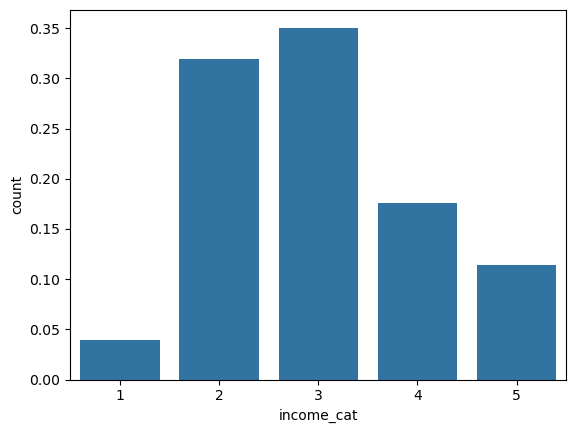

In [15]:
sns.barplot(x = cat_plot.index, y = cat_plot['count']);

Соответствие данным нормальному распределению

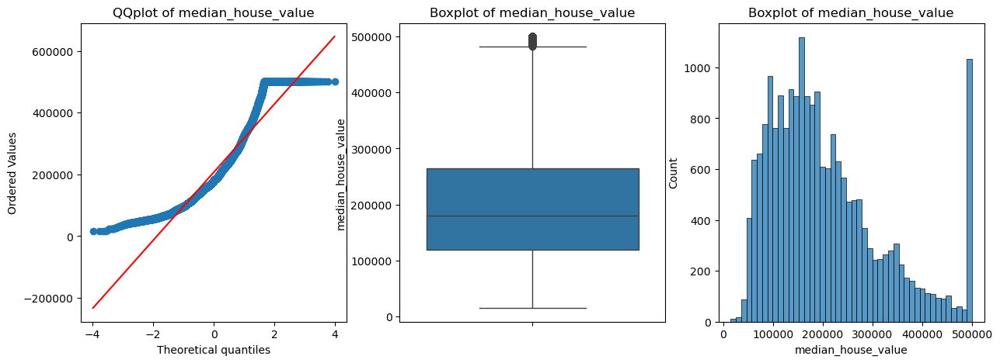

In [16]:
fig, ax = plt.subplots(1,3, figsize=(15,5))
stats.probplot(housing['median_house_value'],plot=ax[0])
ax[0].get_lines()[0].set_markerfacecolor('tab:blue') # 
ax[0].get_lines()[0].set_markeredgecolor('tab:blue') #
ax[0].set_title("QQplot of median_house_value")

# Boxplot
sns.boxplot(housing['median_house_value'],ax=ax[1],orient="v")
ax[1].set_title("Boxplot of median_house_value")

# Boxplot
sns.histplot(housing['median_house_value'],ax=ax[2])
ax[2].set_title("Boxplot of median_house_value")
plt.show()

<Axes: xlabel='population', ylabel='median_house_value'>

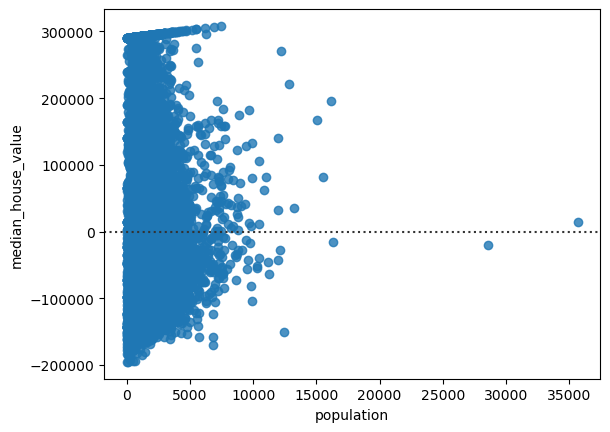

In [17]:
sns.residplot(data=housing, x="population", y="median_house_value")

<Axes: xlabel='median_house_value', ylabel='population'>

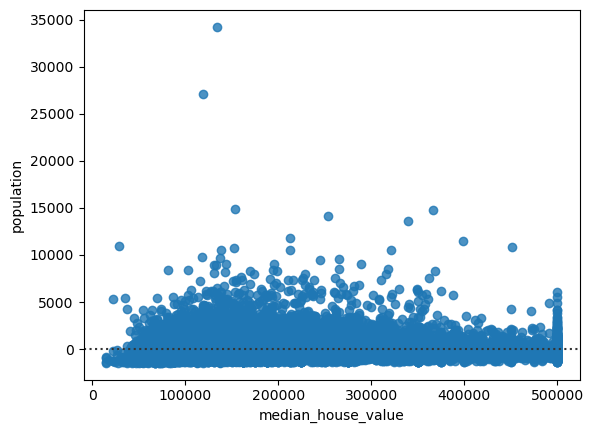

In [18]:
sns.residplot(data=housing, x="median_house_value", y="population" )

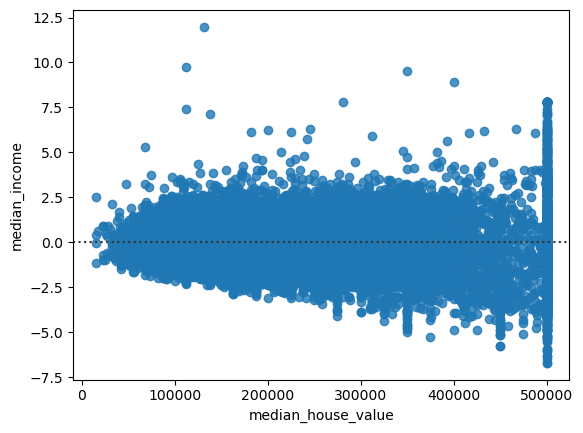

In [19]:
sns.residplot(data=housing, x="median_house_value", y="median_income");

<Axes: xlabel='median_house_value', ylabel='median_income'>

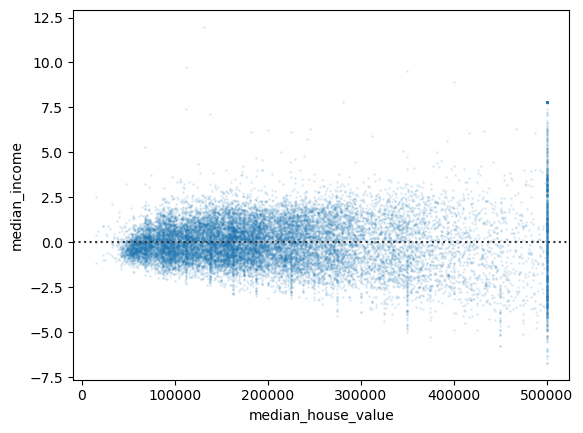

In [20]:
sns.residplot(data=housing, x="median_house_value", y="median_income", scatter_kws=dict(alpha=0.1, s=1))

## Визуализация данных на географических картах

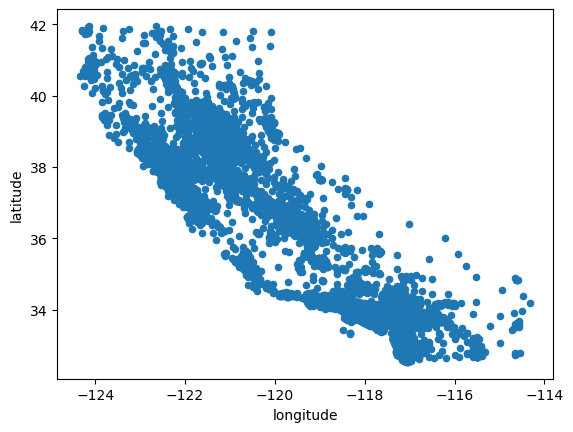

In [21]:
housing.plot(kind="scatter", x="longitude", y="latitude");

Очертания вполне напоминают Калифорнию, но трудно разглядеть конкретный области высокой плотности. Установка параметра alpha = О.1 значительно облегчает обнаружение мест, где имеется высокая плотность точек данных.

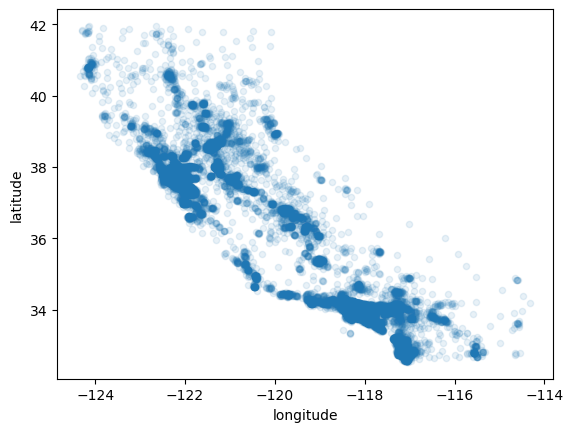

In [22]:
housing.plot(kind="scatter", x="longitude", y="latitude", alpha=0.1);

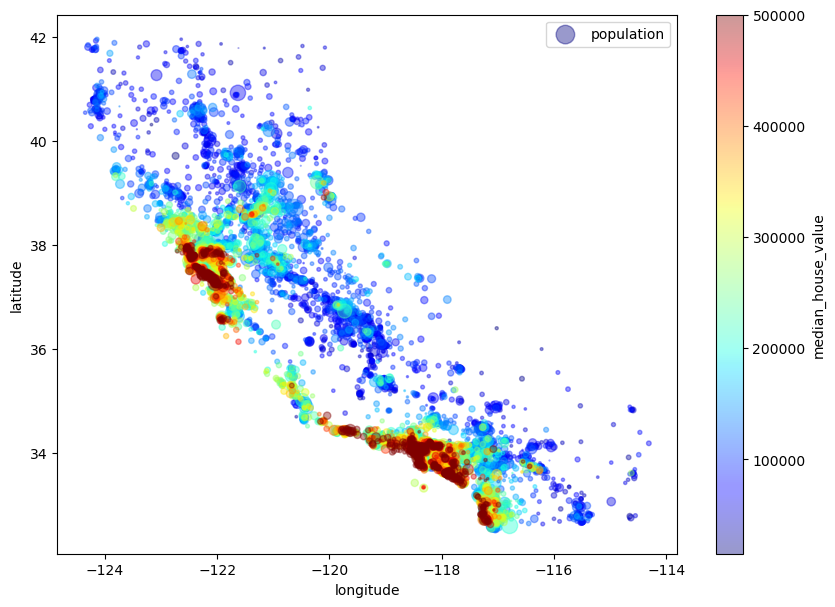

In [23]:
housing.sort_values(by=["median_house_value"], ascending=True).plot(kind="scatter", x="longitude", y="latitude", alpha=0.4,
             s=housing["population"]/100, label="population", figsize=(10,7),
             c="median_house_value", cmap=plt.get_cmap("jet"), colorbar=True,
             sharex=False)
plt.legend();

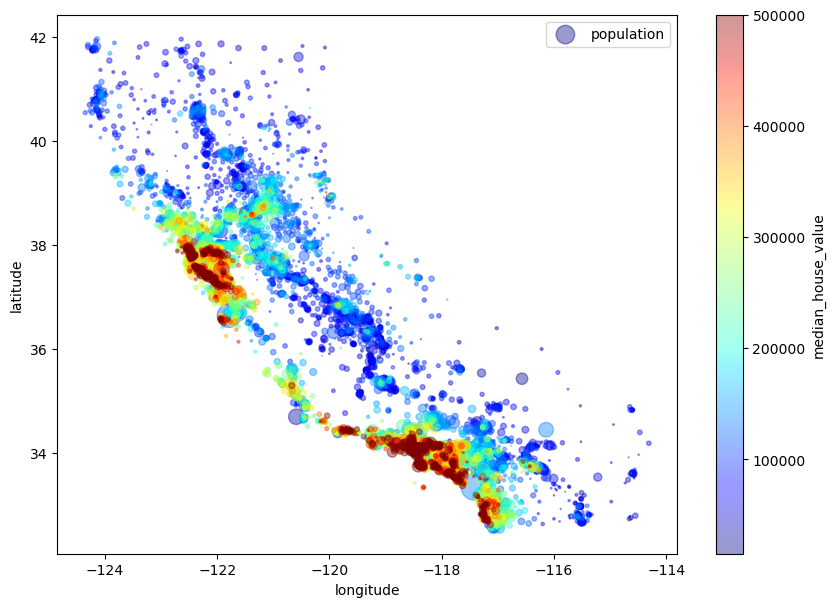

In [24]:
# Способ улучшить даные на графике, места высокой плотности

hous = housing.sort_values(by=["median_house_value"],ascending=True)

hous.plot(kind="scatter", 
          x = "longitude", y = "latitude", alpha = 0.4,
          s = hous["population"]/100, 
          label="population", 
          figsize=(10,7),
          c = "median_house_value", 
          cmap=plt.get_cmap("jet"), 
          colorbar=True,
          sharex=False
         )
plt.legend();

In [25]:
hous.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,income_cat
19802,-123.17,40.31,36.0,98.0,28.0,18.0,8.0,0.5360,14999.0,INLAND,1
2521,-122.74,39.71,16.0,255.0,73.0,85.0,38.0,1.6607,14999.0,INLAND,2
2799,-117.02,36.40,19.0,619.0,239.0,490.0,164.0,2.1000,14999.0,INLAND,2
9188,-117.86,34.24,52.0,803.0,267.0,628.0,225.0,4.1932,14999.0,INLAND,3
5887,-118.33,34.15,39.0,493.0,168.0,259.0,138.0,2.3667,17500.0,<1H OCEAN,2


In [26]:
import plotly.express as px

fig = px.scatter_mapbox(hous, lat="latitude", lon="longitude", hover_name=hous.index, 
                        hover_data=["population", "median_income", 'housing_median_age'],
                        color_discrete_sequence=["gray"], zoom=4, height=400)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [27]:
fig = px.scatter_mapbox(hous, lat="latitude", lon="longitude", hover_name=hous.index, 
                        hover_data=["population", "median_income", 'housing_median_age'],
                        size = hous["population"]/100,
                        color = 'median_house_value',
                        color_continuous_scale = px.colors.sequential.Jet,
                        opacity = 0.4,
                        zoom=5, height=500)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.update_mapboxes(pitch=100)
fig.show()

In [28]:
fig = px.density_mapbox(hous, lat="latitude", lon="longitude", z="population", radius=7,
                        color_continuous_scale = px.colors.sequential.Jet,
                        opacity = 0.5,
                        zoom=5, height=400,
                        mapbox_style="open-street-map")
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.update_mapboxes(pitch=100)
fig.show()

## Взглянем на корреляцию

In [29]:
housing

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,income_cat
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY,5
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY,5
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY,5
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY,4
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY,3
...,...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND,2
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND,2
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND,2
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND,2


In [30]:
corr_matrix = housing.corr(numeric_only=True)

corr_matrix["median_house_value"].sort_values(ascending=False)

median_house_value    1.000000
median_income         0.688075
total_rooms           0.134153
housing_median_age    0.105623
households            0.065843
total_bedrooms        0.049686
population           -0.024650
longitude            -0.045967
latitude             -0.144160
Name: median_house_value, dtype: float64

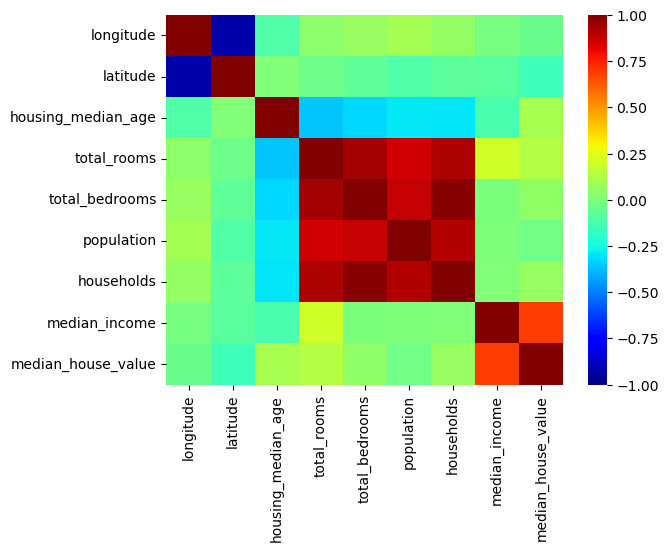

In [31]:
sns.heatmap(corr_matrix, 
        xticklabels=corr_matrix.columns,
        yticklabels=corr_matrix.columns,
        cmap=plt.get_cmap("jet"),
        vmin=-1, vmax=1);